# HRV EDA

In [334]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from general_utils import utils
from general_utils.OverallDetailComparisonPlot import OverallDetailComparisonPlot
utils.default_plot_format()
utils.pd_display_settings(3)

Predefine where data is and where the plotly images will be saved

In [335]:
import os

data_path = "processed_data/outliers_10min_Nabian_2025_02_27.pkl"


In [336]:


pickled = pd.read_pickle(data_path)
data = pickled["data"]
indicator_columns = pickled["indicator_columns"]
time_metrics = pickled["time_metrics"]
frequency_metrics = pickled["frequency_metrics"]
non_linear_metrics = pickled["non_linear_metrics"]

data.head()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,VLF Power,VLF Peak Frequency,...,UCr (g),UACR (mg÷g),Complications,Nephropathy,Retinopathy and cataract,DPN,Heart Disease,atherosclerosis or stenosis,Carotid Plaque,Condition
0,0.76,600.40,59.95,50.34,4.16,81.75,0.00417,0,3.31,0.03,...,NaN,NaN,0,0,0,False,0,0,0,Diabetes
1,601.06,1201,92.83,81.17,12.72,73.95,0.0364,0.00167,10.50,0.03,...,NaN,NaN,0,0,0,False,0,0,0,Diabetes
2,1202,1801,76.87,72.75,13.53,70.25,0.00296,0.00167,4.76,0.0267,...,NaN,NaN,0,0,0,False,0,0,0,Diabetes
3,1802,2402,65.98,54.86,10.43,71.96,0.0153,0,5.19,0.0384,...,NaN,NaN,0,0,0,False,0,0,0,Diabetes
4,2402,3002,56.02,32.69,3.59,78.11,0.0146,0,11.30,0.035,...,NaN,NaN,0,0,0,False,0,0,0,Diabetes


# Raw Plotting

In [337]:
htmL_save_folder = "html_plots/new_metrics"
if not os.path.exists(htmL_save_folder):
    os.makedirs(htmL_save_folder)

for column in indicator_columns:
    break
    title = f"{column} in PDR patients"
    plotter = OverallDetailComparisonPlot(data=data, 
    x_column="id",
    y_column=column,
    hue_column="DPN",
    title=title)
    plotter.save(htmL_save_folder, title)

# Median only comparison:
We first derive median of each metric and put them into a single df

In [338]:

median_df = data.groupby(['id', 'DPN'])[indicator_columns].median()

median_df = median_df.reset_index()

median_melted = pd.melt(
    median_df, 
    id_vars=['id', 'DPN'], 
    value_vars=indicator_columns,
    var_name='Metric', 
    value_name='Value'
).reset_index(drop=True)

median_melted.tail()

,id,DPN,Metric,Value
515,20101822,True,D2,-3.10
516,20120922,False,D2,-2.10
517,20121033,False,D2,-3.71
518,20121718,False,D2,-1.85
519,20123017,True,D2,-2.51


In [339]:
from general_utils.CorrectedMultivariableTest import CorrectedMultivariableTest

test = CorrectedMultivariableTest(
    data=median_melted, 
    group_col='Metric',
    value_col='Value',
    cat_col='DPN',
    cat_val_1=False,
    cat_val_2=True
)
result = test.perform_t_tests()
result.sort_values('p_value', inplace=True)
display(result)

,t_statistic,p_value,significant,BH_corrected_p_value,BH_Significant
Metric,,,,,
VLF Power,3.54,0.00233,True,0.0466,True
HF Power,3.25,0.00346,True,0.0346,True
LF Power,3.22,0.00439,True,0.0293,True
pNN50 (%),2.99,0.00646,True,0.0323,True
S,3.04,0.00828,True,0.0331,True
Mean HR (bpm),-2.99,0.0184,True,0.0615,False
SD2,2.81,0.0354,True,0.10,False
SDRR,2.74,0.039,True,0.0975,False
RMSSD,2.58,0.0414,True,0.0919,False


# Deciles approach

In [340]:
def draw_by_decile(data, column):
    title = f"{column} in PDR patients"
    plotter = OverallDetailComparisonPlot(
        data=data.sort_values("DPN", ascending=True),
        x_column="id",
        y_column=column,
        hue_column=f"{column}_decile",
        title=title,
        category_orders={f"{column}_decile": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]},
        detail_mode="strip",
    )
    fig2 = plotter.fig2
    import plotly.graph_objects as go


    plotter.fig.add_shape(
        type="rect",
        x0=len(data["id"].unique())-4.5,
        x1=len(data["id"].unique()),
        y0=data[column].min()-data[column].max()*0.05,
        y1=data[column].max()*0.93,
        line=dict(color="red", width=2),
        fillcolor="rgba(255, 0, 0, 0.2)",
        name="Highlight",
        row=1,
        col=2,
    )

    plotter.update_legend()

    plotter.setup_general_layout(1000, 400, 1 / 4)
    plotter.show()

# Deciles for everything

Goal: Confirm that the statistical significance gotten from whole dataset median is not just a lucky shot in the dark.

We first assign appropriate decile value for each metric by patient

In [341]:
from project_utils.deciles import make_decile_column

for column in indicator_columns:  
    data = make_decile_column(data, column)
data.head()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,VLF Power,VLF Peak Frequency,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
0,0.76,600.40,59.95,50.34,4.16,81.75,0.00417,0,3.31,0.03,...,9,1,2,2,3,7,7,8,4,1
1,601.06,1201,92.83,81.17,12.72,73.95,0.0364,0.00167,10.50,0.03,...,5,6,5,6,4,3,3,7,4,5
2,1202,1801,76.87,72.75,13.53,70.25,0.00296,0.00167,4.76,0.0267,...,8,4,4,4,5,9,9,3,4,4
3,1802,2402,65.98,54.86,10.43,71.96,0.0153,0,5.19,0.0384,...,5,3,2,2,2,7,6,6,5,2
4,2402,3002,56.02,32.69,3.59,78.11,0.0146,0,11.30,0.035,...,9,0,0,2,1,6,7,9,0,1


In [342]:
draw_by_decile(data, "pNN50 (%)")

In [343]:


def agg_metric_deciles(data, metric_column, aggfunc="median"):
    """Uses prepared metric decile to aggregates each metric by it"""
    decile_agg_data = data.groupby(["DPN", "id", f"{metric_column}_decile"]).agg(
        {metric_column: aggfunc}
    )
    decile_agg_data = decile_agg_data.reset_index()
    decile_agg_data = decile_agg_data.rename(columns={metric_column: "Value", f"{metric_column}_decile": "Decile"})
    return decile_agg_data



def pivot_metric_decile(data, metric_column, aggfunc='median'):
    """Calculates the deciles and aggregates each metric by it"""
    data = make_decile_column(data, metric_column)
    decile_agg_data = agg_metric_deciles(data, metric_column, aggfunc)
    pivot = pd.pivot_table(decile_agg_data, values='Value', index='id', columns='Decile', aggfunc=aggfunc)
    pivot = pivot.join(data[['id', 'DPN']].drop_duplicates().set_index('id'))
    display(pivot)
    return pivot


In [344]:
channels = pd.DataFrame()
for column in indicator_columns:
    agg_decile = agg_metric_deciles(data, column)

    test = CorrectedMultivariableTest(
        data=agg_decile,
        group_col="Decile",
        value_col="Value",
        cat_col="DPN",
        cat_val_1=False,
        cat_val_2=True,
    )

    t_result = test.perform_t_tests()
    t_result.reset_index(drop=False, inplace=True)
    t_result.insert(0, "metric", column)

    channels = pd.concat([channels, t_result])


channels = channels[channels.p_value < 0.1].iloc[:,].reset_index(drop=True)

print(
    "Total promissing channels: ",
    channels.shape[0],
    "from ",
    len(indicator_columns) * 10,
)

display(channels)

Total promissing channels:  103 from  200


,metric,Decile,t_statistic,p_value,significant,BH_corrected_p_value,BH_Significant
0,SDRR,0,4.47,0.000582,True,0.00582,True
1,SDRR,1,3.58,0.00576,True,0.0288,True
2,SDRR,2,3.00,0.0238,True,0.0594,False
3,SDRR,3,3.13,0.0201,True,0.0669,False
4,SDRR,4,2.88,0.0323,True,0.0646,False
...,...,...,...,...,...,...,...
98,ApEn,9,-3.18,0.00409,True,0.0409,True
99,SampEn,7,-2.20,0.0598,False,0.20,False
100,SampEn,8,-2.33,0.0305,True,0.15,False
101,SampEn,9,-3.11,0.00521,True,0.0521,False


# Appendix
## Image for prez

In [345]:
title = "SDRR distribution in PDR patients"
data.sort_values("DPN", inplace=True)
plotter = OverallDetailComparisonPlot(
    data=data[data.id.astype(int) >= 20000000], 
    x_column="id",
    y_column="SDRR",
    hue_column="DPN",
    detail_mode="box",
    points='all',
    title=title)

plotter.fig.update_layout(font=dict(family="Open Sauce", color="black"))


plotter.setup_general_layout(500, 500, 1 / 4)

plotter.show()

plotter.fig.write_image(os.path.join(htmL_save_folder, f"{title}.png"), scale = 6)

# Weighted statistical testing

**THIS IS ALL WRONG SINCE IID IS NOT FULFILLED**

Taking the id and comparing the number of values in decile 1-8, shows that there is a huge variance in usable data points between individuals (82-248).

Hence, we need to establish identical weighting.

In [346]:
display(data)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,VLF Power,VLF Peak Frequency,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
0,0.76,600.40,59.95,50.34,4.16,81.75,0.00417,0,3.31,0.03,...,9,1,2,2,3,7,7,8,4,1
3019,16811,17411,74.64,84.44,5.09,92.42,0.00268,0.00167,4.61,0.035,...,1,2,2,1,6,0,1,7,7,1
3018,16211,16811,48.22,43.50,1.92,88.58,0.0015,0.00167,1.06,0.0367,...,9,0,0,0,0,2,2,9,8,0
3017,15611,16211,97.86,102.59,4.40,90.94,0.019,0.00167,10.96,0.0317,...,9,3,3,3,3,0,0,6,5,4
3016,15010,15610,114.53,127.53,12.33,86.03,0.00792,0,14.28,0.0333,...,5,4,4,4,5,1,1,3,6,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4201,2403,3002,22.84,14.53,0.10,99.24,0.00033,0.00167,0.19,0.0267,...,9,0,0,0,3,5,5,7,7,0
4202,3003,3602,19.22,16.25,0.30,100.09,0.000716,0.00167,0.11,0.0334,...,4,0,1,0,6,6,9,3,6,0
4203,3603,4202,19.89,13.82,0,99.40,0.000233,0.00167,0.12,0.0267,...,7,0,0,0,4,6,9,6,6,0
4225,16808,17408,35.21,34.58,4.22,83.01,0.000912,0.00167,1.00,0.015,...,4,4,5,2,7,9,9,4,3,2


Best solution for this appears to be a weighted t-test

### How to choose the weights?
Each individual being given a weight of 1 is wrong, since they have multiple datapoint.
Instead I tried to make sure that each individual is downweighted, so the weight sum between individuals is identical.



. Hence, the weight of each datapoint is inverse to the number individual's datapoint.

In [347]:
def apply_data_weight(data, weight_by_col='id'):
    "Adds a test_wight column to dataframe. Also shows weightings applied to each group"
    

    data["test_weight"] = data.groupby(weight_by_col)[weight_by_col].transform("count")
    data["test_weight"] =  data["test_weight"].min() /data["test_weight"]

    weight_comparison = pd.DataFrame({
        'n_data': data.groupby(weight_by_col).size(),
        'post_weight_df': data.groupby(weight_by_col)["test_weight"].sum().astype(int),
        'datum_weight': data.groupby(weight_by_col)["test_weight"].mean()
    })
    print("The data was weighted as follows:")
    display(weight_comparison)
    return data

data= apply_data_weight(data, 'id')
print(len(data.id.unique()))

The data was weighted as follows:


,n_data,post_weight_df,datum_weight
id,,,
19070921,55,55,1
19072205,76,55,0.72
19072214,130,55,0.42
19072938,100,55,0.55
19072939,92,55,0.60
19072940,126,55,0.44
19080106,117,55,0.47
19081506,145,55,0.38
19082406,61,55,0.90


26


In [348]:
import statsmodels.stats.weightstats as smw
import numpy as np
from statsmodels.stats.multitest import multipletests


pd.options.display.float_format = lambda x: f'{x:.2f}' if 0.1 <= abs(x) <= 100 else f'{x:.2e}'

def weighted_t_test(df, column, mask, weight_column='test_weight'):
    values_1 = df[mask][column]
    values_2 = df[~mask][column]

    weights_1 = df[mask][weight_column]
    weights_2 = df[~mask][weight_column]



    t_stat, p_value, df = smw.ttest_ind(
        values_1,
        values_2,
        usevar="unequal",
        weights=(weights_1, weights_2))
    
    weighted_mean_1 = np.average(values_1, weights=weights_1)
    weighted_mean_2 = np.average(values_2, weights=weights_2)
    
    weighted_std_1 = np.sqrt(np.average((values_1 - weighted_mean_1)**2, weights=weights_1))
    weighted_std_2 = np.sqrt(np.average((values_2 - weighted_mean_2)**2, weights=weights_2))
    
    result = {
        'weight_mean_1': weighted_mean_1,
        'weight_mean_2': weighted_mean_2,
        'weighted_std_1': weighted_std_1,
        'weighted_std_2': weighted_std_2,
        't_stat': t_stat,
        'df': df,
        'p_value': p_value,
    }
    
    return result


def metric_weighted_test(data, metrics, mask, weight_column='test_weight'):
    results = []
    for metric in metrics:
        result = weighted_t_test(data, metric, mask=mask)
        result['metric'] = metric
        results.append(result)
    result_df = pd.DataFrame(results)
    result_df.set_index('metric', inplace=True)
    return result_df



PDN_mask = data["DPN"] == True
result_df = metric_weighted_test(data, indicator_columns, mask=PDN_mask)

display(result_df)


,weight_mean_1,weight_mean_2,weighted_std_1,weighted_std_2,t_stat,df,p_value
metric,,,,,,,
SDRR,46.02,82.64,38.74,52.07,-12.14,3.78e+02,6.92e-29
RMSSD,39.30,78.88,45.98,66.14,-10.87,4.04e+02,2.67e-24
pNN50 (%),4.11,13.08,7.43,17.00,-12.80,7.16e+02,6.27e-34
Mean HR (bpm),82.57,75.24,9.76,11.22,9.98,3.33e+02,1.09e-20
VLF Power,1.70,5.44,3.45,7.63,-11.69,6.82e+02,6.79e-29
VLF Peak Frequency,2.83e-02,3.04e-02,8.43e-03,6.76e-03,-3.42,2.72e+02,7.30e-04
LF Power,34.20,1.17e+02,79.93,1.94e+02,-10.69,7.77e+02,5.52e-25
LF Peak Frequency,9.59e-02,0.11,3.70e-02,3.21e-02,-5.23,2.82e+02,3.31e-07
HF Power,5.10e+02,1.76e+03,1.26e+03,3.13e+03,-10.13,7.99e+02,9.11e-23



## multiple test correction
Since multiple values were processed, it is necessary to account for a false positive discovery rate.

Bonferroni correction:
* Is very conservative.
* Dead easy to code
    * Does not matter since I'm using statsmodels library

Benjamini-Yekutieli (fdr_by):
* More conservative (fewer discoveries) but ensures stronger error control in correlated data.
* remains valid under arbitrary dependence (e.g., correlated test statistics).
* Compared to methods like Bonferroni correction, which control FWER, BY correction is less conservative and preserves more statistical power.
    * This allows researchers to detect more true positives while still controlling for false discoveries.
* The main drawback of the BY correction is that it is more conservative than BH, meaning it reduces the number of discoveries slightly.

In [349]:
# Apply Benjamini-Hochberg correction


def p_hacking_correction(result_df, alpha=0.05, method = 'bonferroni'):

    result_df[f'p_{method}'] = multipletests(result_df['p_value'], method= method)[1]
    result_df['p_adj<0.05'] = result_df[f'p_{method}'] < alpha
    return result_df

result_df = p_hacking_correction(result_df, 0.05, 'fdr_by')

We than have a separate function to make a more concise test result.

In [350]:
def display_test_result_df(result_df):
    result_df = result_df.copy()

    rename = {
        'weight_mean_1': "PDN_mean",
        'weight_mean_2': "Diabetes_mean",
        'weighted_std_1': "PDN_std",
        'weighted_std_2': "Diabetes_std",
    }

    result_df['df'] = result_df['df'].astype(int)
    result_df['t_stat'] = result_df['t_stat'].astype(float).round(2)

    result_df.columns = pd.MultiIndex.from_tuples(
        [('Weighted Parameters', result_df.columns[0]),
         ('Weighted Parameters', result_df.columns[1]),
         ('Weighted Parameters', result_df.columns[2]),
         ('Weighted Parameters', result_df.columns[3]),
         ('Raw Statistics', result_df.columns[4]),
         ('Raw Statistics', result_df.columns[5]),
         ('Raw Statistics', result_df.columns[6]),
         ('Adjusted Statistics', result_df.columns[7]),
         ('Adjusted Statistics', result_df.columns[8])]
    )
    
    def float_format(x):
        if 0.01 <= abs(x) <= 1000:
            return f'{x:.2f}'
        elif 0.001 <= abs(x) < 0.01:
            return f'{x:.3f}'
        else:
            return f'{x:.2e}'
    
    pd.options.display.float_format = float_format

    result_df.rename(columns=rename, inplace=True)

    display(result_df)
    return result_df

#display_test_result_df(result_df).to_csv('processed_data/Benjamini-Yekutieli_adjusted_statistics_11-02-2025.csv')

# Heart rate as invariant metric.
Since HR is determined by individuals activity and bodily state and HRV is determined on five minute intervals it should be a good metric to compare others against.

First we discard any unrealistic HR values

In [351]:
data = data[data["Mean HR (bpm)"]>45]

In [352]:
title = f"HR (bpm) in Diabetic peripheral neuropathy patients"
plotter = OverallDetailComparisonPlot(
    data=data, 
    x_column="id",
    y_column="Mean HR (bpm)",
    hue_column="DPN",
    detail_mode="box",
    points='all',
    title=title)
plotter.show()

There is a lot of variance in heartbeat between each individual.

We can see that va

In [353]:
display(data)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,VLF Power,VLF Peak Frequency,...,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile,test_weight
0,0.76,6.00e+02,59.95,50.34,4.16,81.75,4.17e-03,0.00e+00,3.31,3.00e-02,...,1,2,2,3,7,7,8,4,1,1.00
3019,1.68e+04,1.74e+04,74.64,84.44,5.09,92.42,2.68e-03,1.67e-03,4.61,3.50e-02,...,2,2,1,6,0,1,7,7,1,0.49
3018,1.62e+04,1.68e+04,48.22,43.50,1.92,88.58,1.50e-03,1.67e-03,1.06,3.67e-02,...,0,0,0,0,2,2,9,8,0,0.49
3017,1.56e+04,1.62e+04,97.86,1.03e+02,4.40,90.94,1.90e-02,1.67e-03,10.96,3.17e-02,...,3,3,3,3,0,0,6,5,4,0.49
3016,1.50e+04,1.56e+04,1.15e+02,1.28e+02,12.33,86.03,7.92e-03,0.00e+00,14.28,3.33e-02,...,4,4,4,5,1,1,3,6,4,0.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4201,2.40e+03,3.00e+03,22.84,14.53,0.10,99.24,3.30e-04,1.67e-03,0.19,2.67e-02,...,0,0,0,3,5,5,7,7,0,0.50
4202,3.00e+03,3.60e+03,19.22,16.25,0.30,1.00e+02,7.16e-04,1.67e-03,0.11,3.34e-02,...,0,1,0,6,6,9,3,6,0,0.50
4203,3.60e+03,4.20e+03,19.89,13.82,0.00e+00,99.40,2.33e-04,1.67e-03,0.12,2.67e-02,...,0,0,0,4,6,9,6,6,0,0.50
4225,1.68e+04,1.74e+04,35.21,34.58,4.22,83.01,9.12e-04,1.67e-03,1.00,1.50e-02,...,4,5,2,7,9,9,4,3,2,0.50


In [354]:
import general_utils.utils as u


data["Mean HR (bpm)"] = data["Mean HR (bpm)"].astype(float)
decile = data
decile['Decile'] = decile.groupby('id')["Mean HR (bpm)"].transform(lambda x: pd.qcut(x, 10, labels=False))

decile.head()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,VLF Power,VLF Peak Frequency,...,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile,test_weight,Decile
0,0.76,6.00e+02,59.95,50.34,4.16,81.75,4.17e-03,0.00e+00,3.31,3.00e-02,...,2,2,3,7,7,8,4,1,1.00,7
3019,1.68e+04,1.74e+04,74.64,84.44,5.09,92.42,2.68e-03,1.67e-03,4.61,3.50e-02,...,2,1,6,0,1,7,7,1,0.49,9
3018,1.62e+04,1.68e+04,48.22,43.50,1.92,88.58,1.50e-03,1.67e-03,1.06,3.67e-02,...,0,0,0,2,2,9,8,0,0.49,8
3017,1.56e+04,1.62e+04,97.86,1.03e+02,4.40,90.94,1.90e-02,1.67e-03,10.96,3.17e-02,...,3,3,3,0,0,6,5,4,0.49,9
3016,1.50e+04,1.56e+04,1.15e+02,1.28e+02,12.33,86.03,7.92e-03,0.00e+00,14.28,3.33e-02,...,4,4,5,1,1,3,6,4,0.49,7


Check whether the decile is correctly calculated

In [355]:
title = "Deciles of Mean HR (bpm) in PDR patients"
plotter = OverallDetailComparisonPlot(data=decile, 
                    x_column="id",
                    y_column="Mean HR (bpm)",
                    hue_column="Decile",
                    title=title,
                    category_orders={"Decile": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]})
plotter.setup_general_layout(ratio=1/5)
                    
plotter.show()

In [356]:
df_decile = decile[~decile.Decile.isin([0, 9])]
df_decile = df_decile[df_decile['SDRR'] <= 1000]
df_decile = df_decile[df_decile['RMSSD'] <= 1000]

In [357]:


HRV_metric_columns = indicator_columns.drop(['Mean HR (bpm)', 'VLF Power', 'LF Power', 'HF Power'])
print(HRV_metric_columns)



for metric in  HRV_metric_columns:
    break
    plt.figure(figsize=(8, 3.5))

    sns.regplot(data =df_decile [df_decile ['DPN'] == False], x='Mean HR (bpm)', y=metric, ci=99, marker='o', scatter=False, label='Diabetes')
    sns.regplot(data=df_decile[df_decile['DPN'] == True], x='Mean HR (bpm)', y=metric, ci=99, marker='o', scatter=False, label='DPN')

    sns.scatterplot(data=df_decile, x='Mean HR (bpm)', y=metric, hue='DPN', alpha=0.1)
    plt.legend()
    plt.title(f'Best Fit Line Mean HR (bpm) and {metric} split by DPN')

    plt.tight_layout()
    plt.show();

Index(['SDRR', 'RMSSD', 'pNN50 (%)', 'VLF Peak Frequency', 'LF Peak Frequency',
       'HF Peak Frequency', 'LF÷HF Ratio', 'S', 'SD1', 'SD2', 'SD1÷SD2',
       'ApEn', 'SampEn', 'DFA α1', 'DFA α2', 'D2'],
      dtype='object')


In [358]:
decile_mask = df_decile["DPN"]==True

decile_result_df = metric_weighted_test(df_decile, indicator_columns, mask=decile_mask)

# Apply Benjamini-Hochberg correction
decile_result_df = p_hacking_correction(decile_result_df, 0.05, 'fdr_by')

display_test_result_df(decile_result_df);

Weighted Parameters                                      \
                              PDN_mean Diabetes_mean  PDN_std Diabetes_std   
metric                                                                       
SDRR                             46.42         82.51    39.48        51.70   
RMSSD                            40.25         77.92    47.63        65.77   
pNN50 (%)                         4.07         12.60     7.42        16.10   
Mean HR (bpm)                    82.29         74.78     7.88         9.48   
VLF Power                         1.85          5.36     3.68         7.28   
VLF Peak Frequency                0.03          0.03    0.009        0.007   
LF Power                         37.07        115.39    84.98       191.40   
LF Peak Frequency                 0.10          0.11     0.04         0.03   
HF Power                        528.56      1.70e+03 1.28e+03     3.01e+03   
HF Peak Frequency                 0.34          0.33     0.05         0.06   
LF÷HF Ratio                       0.12          0.13     0.09         0.14   
S                             9.60e+03      2.54e+04 1.89e+04     3.83e+04   
SD1                              28.46         55.10    33.68        46.50   
SD2                              57.91        101.20    45.98        59.12   
SD1÷SD2                           0.42          0.50     0.22         0.21   
ApEn                              1.00          0.96     0.31         0.29   
SampEn                            1.05          0.97     0.46         0.41   
DFA α1                            0.98          0.95     0.27         0.24   
DFA α2                            1.00          0.85     0.25         0.22   
D2                               -4.11         -2.64     1.85         0.81   

                   Raw Statistics               Adjusted Statistics             
                           t_stat   df  p_value            p_fdr_by p_adj<0.05  
metric                                                                          
SDRR                       -10.53  294 3.19e-22            5.73e-21       True  
RMSSD                       -8.99  309 2.48e-17            1.98e-16       True  
pNN50 (%)                  -11.12  529 5.58e-26            4.01e-24       True  
Mean HR (bpm)               11.20  274 3.19e-24            1.15e-22       True  
VLF Power                   -9.61  468 4.59e-20            6.50e-19       True  
VLF Peak Frequency          -2.78  214    0.006                0.03       True  
LF Power                    -8.77  557 2.19e-17            1.98e-16       True  
LF Peak Frequency           -4.32  224 2.31e-05            1.20e-04       True  
HF Power                    -8.50  594 1.58e-16            1.13e-15       True  
HF Peak Frequency            3.72  267 2.42e-04               0.001       True  
LF÷HF Ratio                 -1.44  322     0.15                0.60      False  
S                           -8.34  482 8.09e-16            5.29e-15       True  
SD1                         -8.99  309 2.48e-17            1.98e-16       True  
SD2                        -10.89  290 2.15e-23            5.17e-22       True  
SD1÷SD2                     -4.32  232 2.33e-05            1.20e-04       True  
ApEn                         1.34  231     0.18                0.69      False  
SampEn                       2.10  227     0.04                0.16      False  
DFA α1                       1.30  227     0.19                0.70      False  
DFA α2                       7.74  226 3.24e-13            1.94e-12       True  
D2                         -10.30  186 5.42e-20            6.50e-19       True

Bellow are the results we got without discarding the 0th and 9th decile in Heart rate (BPM)

In [359]:
display_test_result_df(result_df);

Weighted Parameters                                      \
                              PDN_mean Diabetes_mean  PDN_std Diabetes_std   
metric                                                                       
SDRR                             46.02         82.64    38.74        52.07   
RMSSD                            39.30         78.88    45.98        66.14   
pNN50 (%)                         4.11         13.08     7.43        17.00   
Mean HR (bpm)                    82.57         75.24     9.76        11.22   
VLF Power                         1.70          5.44     3.45         7.63   
VLF Peak Frequency                0.03          0.03    0.008        0.007   
LF Power                         34.20        117.29    79.93       194.29   
LF Peak Frequency                 0.10          0.11     0.04         0.03   
HF Power                        509.88      1.76e+03 1.26e+03     3.13e+03   
HF Peak Frequency                 0.34          0.33     0.05         0.06   
LF÷HF Ratio                       0.12          0.12     0.09         0.13   
S                             9.26e+03      2.56e+04 1.82e+04     3.85e+04   
SD1                              27.79         55.78    32.51        46.77   
SD2                              57.63        101.03    45.51        59.58   
SD1÷SD2                           0.42          0.51     0.22         0.21   
ApEn                              0.98          0.95     0.32         0.30   
SampEn                            1.04          0.96     0.47         0.43   
DFA α1                            0.98          0.94     0.27         0.24   
DFA α2                            1.00          0.84     0.26         0.22   
D2                               -4.06         -2.64     1.79         0.83   

                   Raw Statistics               Adjusted Statistics             
                           t_stat   df  p_value            p_fdr_by p_adj<0.05  
metric                                                                          
SDRR                       -12.14  378 6.92e-29            1.24e-27       True  
RMSSD                      -10.87  403 2.67e-24            2.40e-23       True  
pNN50 (%)                  -12.80  715 6.27e-34            4.51e-32       True  
Mean HR (bpm)                9.98  332 1.09e-20            7.12e-20       True  
VLF Power                  -11.69  682 6.79e-29            1.24e-27       True  
VLF Peak Frequency          -3.42  272 7.30e-04               0.003       True  
LF Power                   -10.69  777 5.52e-25            7.94e-24       True  
LF Peak Frequency           -5.23  281 3.31e-07            1.70e-06       True  
HF Power                   -10.13  799 9.11e-23            7.28e-22       True  
HF Peak Frequency            3.82  334 1.62e-04            7.75e-04       True  
LF÷HF Ratio                 -0.96  391     0.34                1.00      False  
S                           -9.90  640 1.40e-21            1.00e-20       True  
SD1                        -10.87  403 2.67e-24            2.40e-23       True  
SD2                        -12.33  369 1.76e-29            6.32e-28       True  
SD1÷SD2                     -5.63  294 4.24e-08            2.35e-07       True  
ApEn                         1.56  290     0.12                0.45      False  
SampEn                       2.36  288     0.02                0.08      False  
DFA α1                       2.03  288     0.04                0.17      False  
DFA α2                       8.52  281 9.96e-16            5.97e-15       True  
D2                         -11.51  236 1.23e-24            1.47e-23       True

Now we compar the spread ratios

,metric,spread_type,spread_ratio
0,SDRR,Diabetic Ratio,1.02
1,RMSSD,Diabetic Ratio,1.04
2,pNN50 (%),Diabetic Ratio,1.00
3,Mean HR (bpm),Diabetic Ratio,0.81
4,VLF Power,Diabetic Ratio,1.07
5,VLF Peak Frequency,Diabetic Ratio,1.02
6,LF Power,Diabetic Ratio,1.06
7,LF Peak Frequency,Diabetic Ratio,0.99
8,HF Power,Diabetic Ratio,1.01
9,HF Peak Frequency,Diabetic Ratio,0.97


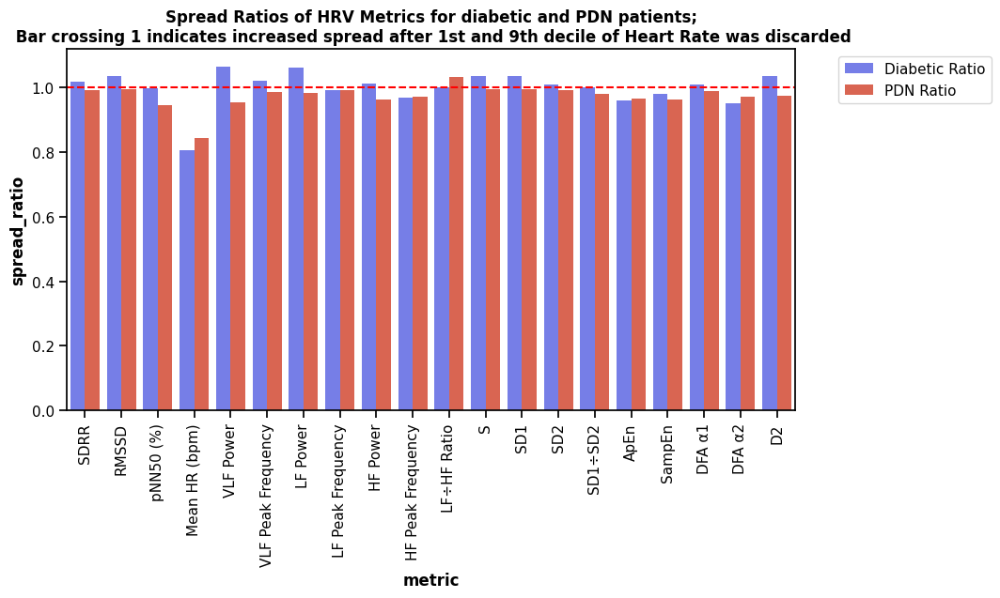

In [360]:
spread_ratios = decile_result_df[['weighted_std_1', 'weighted_std_2']] / result_df[['weighted_std_1', 'weighted_std_2']]
spread_ratios.columns = ['spread_ratio_std_1', 'spread_ratio_std_2']
spread_ratios['metric'] = result_df.index
spread_ratios.set_index('metric', inplace=True)

spread_ratios = spread_ratios.reset_index().melt(id_vars='metric', var_name='spread_type', value_name='spread_ratio')

spread_ratios['spread_type'] = spread_ratios['spread_type'].replace({
    'spread_ratio_std_1': 'Diabetic Ratio',
    'spread_ratio_std_2': 'PDN Ratio'
})


display(spread_ratios)

plt.figure(figsize=(10, 5))
sns.barplot(data=spread_ratios, x='metric', y='spread_ratio', hue='spread_type')
plt.axhline(1, color='red', linestyle='--')
plt.xticks(rotation=90)
plt.title('Spread Ratios of HRV Metrics for diabetic and PDN patients;\n Bar crossing 1 indicates increased spread after 1st and 9th decile of Heart Rate was discarded')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.show()

## Decile allows to isolate a tighter spread for pNN50

In [361]:
title = "Deciles of Mean HR (bpm) in PDR patients"
plotter = OverallDetailComparisonPlot(data=decile, 
                    x_column="id",
                    y_column="pNN50 (%)",
                    hue_column="Decile",
                    title=title,
                    category_orders={"Decile": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]})
plotter.setup_general_layout(1400,600,1/3)
                    
plotter.show()

pNN50 values stabilize have much tighter spread for deciles 5-9